In [ ]:
import os

from azure.ai.vision.imageanalysis import ImageAnalysisClient
from azure.ai.vision.imageanalysis.models import VisualFeatures
from azure.core.credentials import AzureKeyCredential

endpoint = "https://ubb-ocr-lab.cognitiveservices.azure.com/"
key = "placeholder-for-your-key"

client = ImageAnalysisClient(endpoint = endpoint, credential = AzureKeyCredential(key))

image_folder = "images"

total_images = 0
correct = 0

for img_name in os.listdir(image_folder):
    full_path = os.path.join(image_folder, img_name)
    total_images += 1

    has_bike = "bike" in img_name.lower()
    with open(full_path, "rb") as f:
        result = client.analyze(image_data=f.read(), visual_features=[VisualFeatures.TAGS])
    
    found_bike = False

    if result.tags is not None:
        for tag in result.tags.list:
            if tag.name == "bicycle":
                found_bike = True
                break

    if has_bike and found_bike:
        correct += 1
    elif not has_bike and not found_bike:
        correct += 1

print(f"Total images: {total_images}")
print(f"Correct classifications: {correct}")
print(f"Accuracy: {correct / total_images * 100:.2f}%")

Total images: 20
Correct classifications: 20
Accuracy: 100.00%


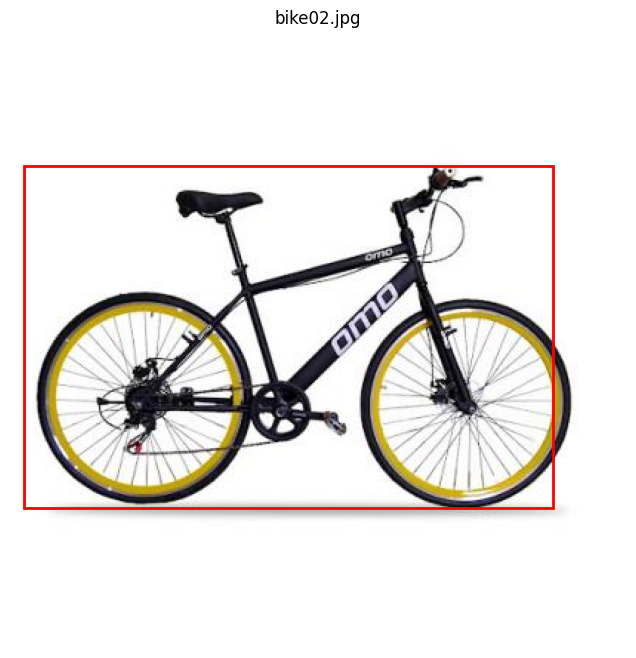

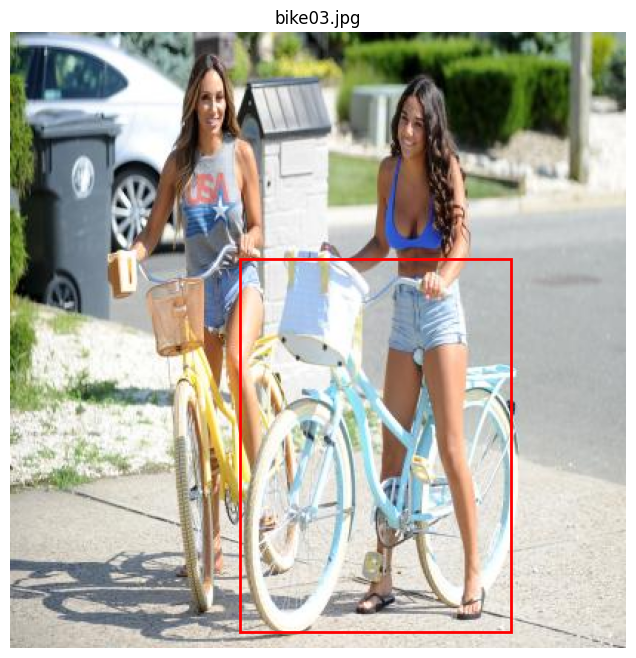

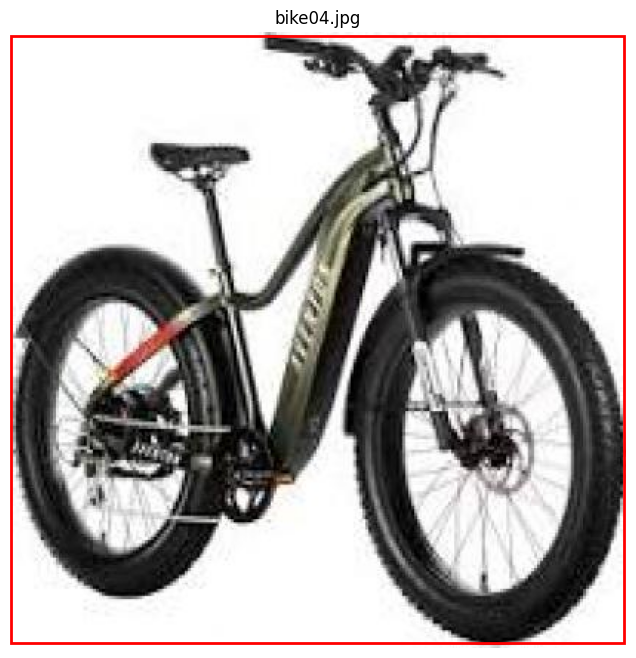

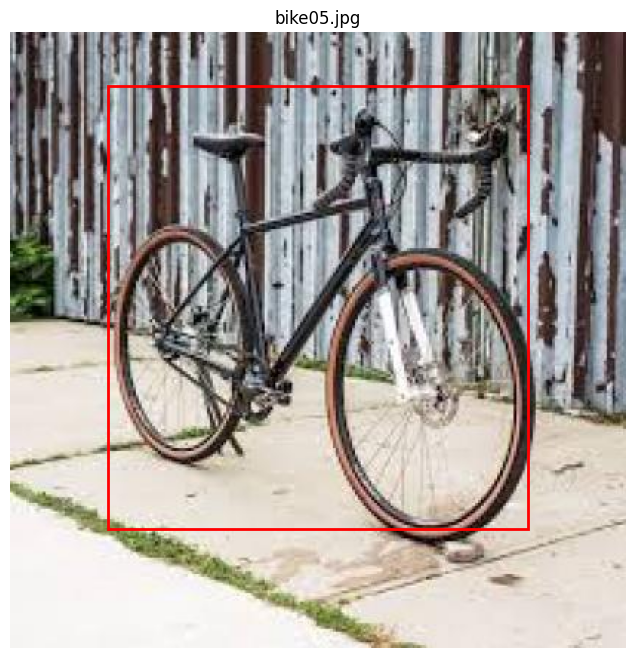

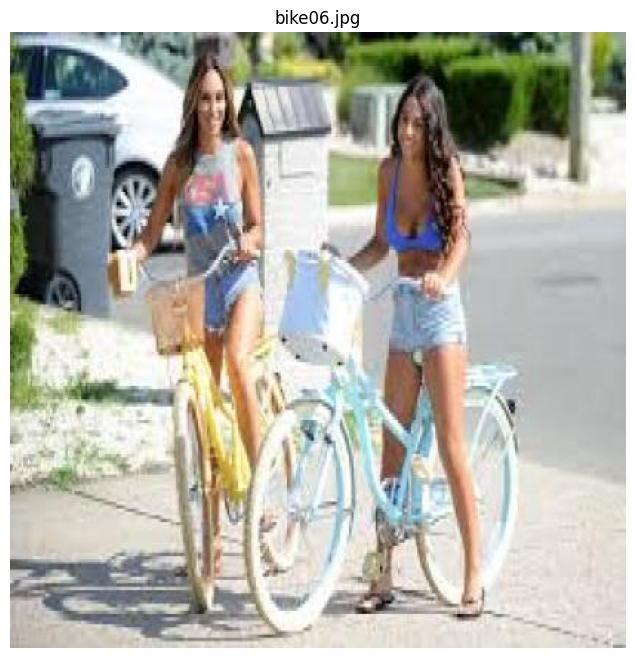

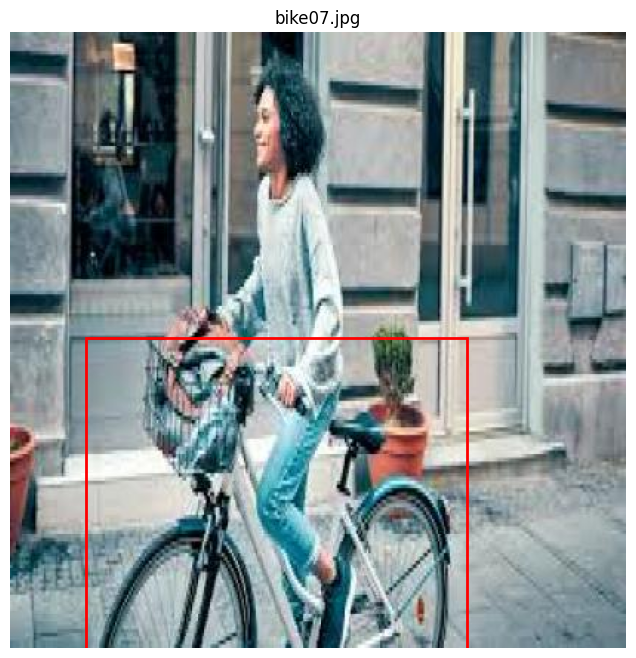

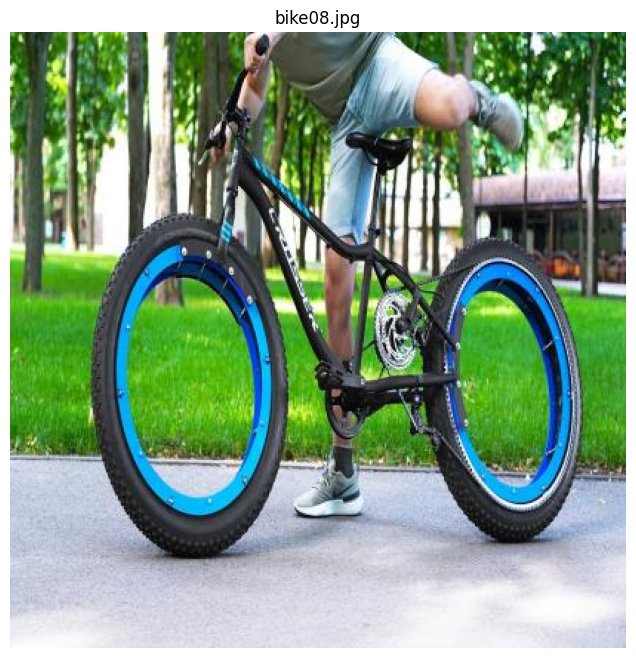

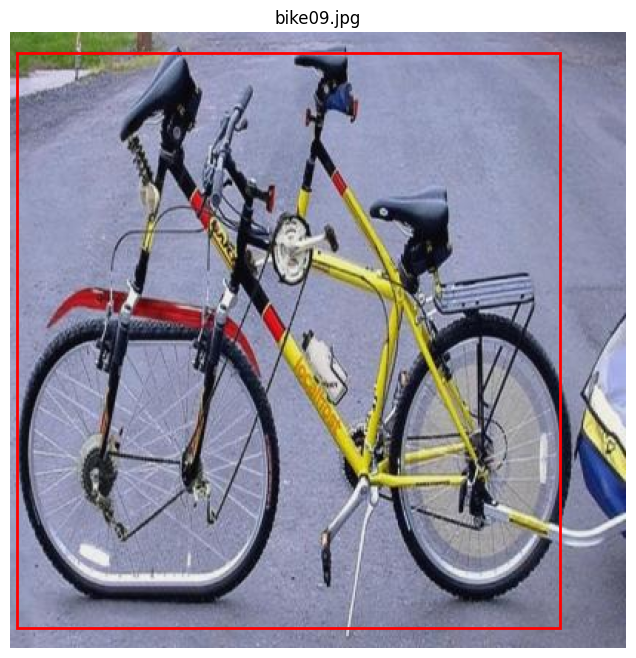

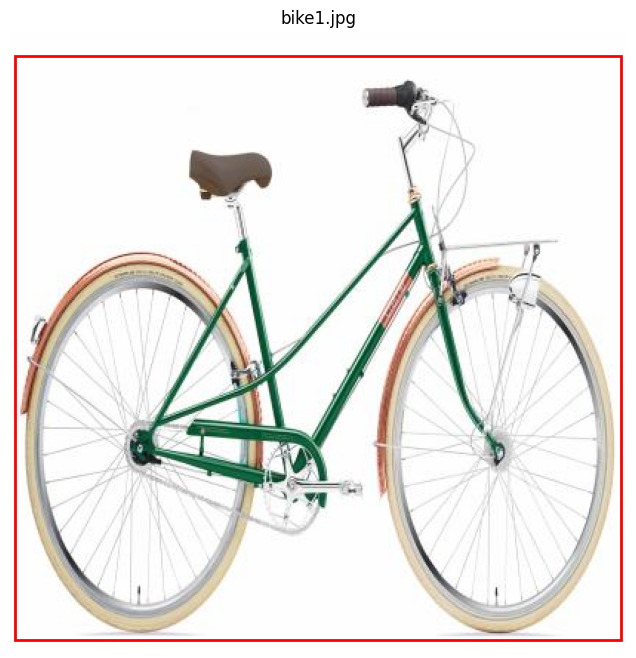

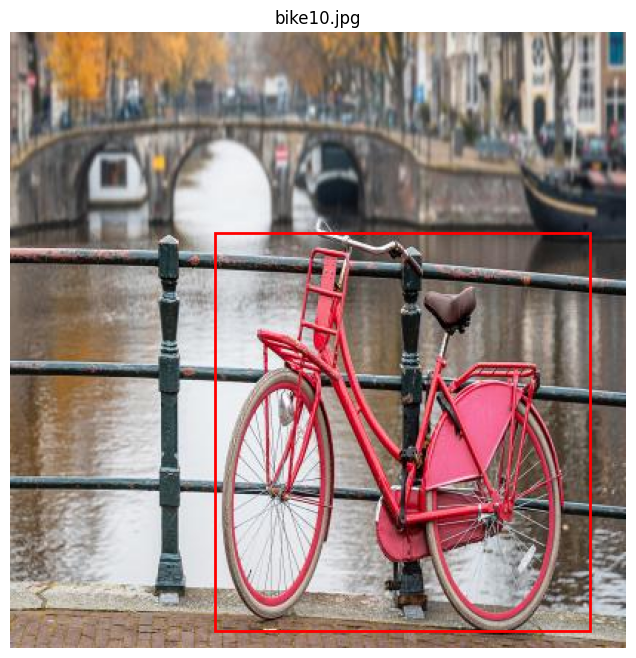

Actual bike count: 10
Detected bike count: 8
Detection accuracy: 80.00%


In [2]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

acutal_bike_count = 0
bicyle_count = 0
for img_name in os.listdir(image_folder):
    if "bike" not in img_name.lower():
        continue
    
    acutal_bike_count += 1

    full_path = os.path.join(image_folder, img_name)
    with open(full_path, "rb") as f:
        result = client.analyze(image_data=f.read(), visual_features=[VisualFeatures.OBJECTS])
    
    img = Image.open(full_path)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(img_name)


    if result.objects is not None:
        for obj in result.objects.list:
            if obj.tags and "bicycle" in obj.tags[0].name.lower():
                bicyle_count += 1
                box = obj.bounding_box
                x = box.x
                y = box.y
                width = box.width
                height = box.height

                rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor="r", facecolor="none")
                ax.add_patch(rect)

    plt.show()

print(f"Actual bike count: {acutal_bike_count}")
print(f"Detected bike count: {bicyle_count}")
print(f"Detection accuracy: {bicyle_count / acutal_bike_count * 100:.2f}%")

In [3]:
import cv2

output = "output.txt"

drawing = False
ix, iy = -1, -1
current_box = []
original_image = None
display_image = None

def draw_rectangle(event, x, y, flags, param):
    global ix, iy, drawing, current_box, display_image

    if event == cv2.EVENT_LBUTTONDOWN:
        drawing = True
        ix, iy = x, y
    
    elif event == cv2.EVENT_MOUSEMOVE:
        if drawing:
            display_image = original_image.copy()
            cv2.rectangle(display_image, (ix, iy), (x, y), (0, 255, 0), 2)
    
    elif event == cv2.EVENT_LBUTTONUP:
        drawing = False
        cv2.rectangle(display_image, (ix, iy), (x, y), (0, 255, 0), 2)

        x_min, y_min = min(ix, x), min(iy, y)
        x_max, y_max = max(ix, x), max(iy, y)
        w, h = x_max - x_min, y_max - y_min
        current_box = [x_min, y_min, w, h]

print("Commands:")
print("  n - Save and go to next image")
print("  r - Reset current box")
print("  q - Quit")

cv2.namedWindow("Image")
cv2.setMouseCallback("Image", draw_rectangle)

with open(output, "w") as f:
    f.write("image_name,x,y,width,height\n")

for img_name in os.listdir(image_folder):
    if "bike" not in img_name.lower():
        continue

    full_path = os.path.join(image_folder, img_name)
    original_image = cv2.imread(full_path)
    display_image = original_image.copy()
    current_box = []

    while True:
        cv2.imshow("Image", display_image)
        key = cv2.waitKey(1) & 0xFF

        if key == ord("n"):
            if current_box:
                with open(output, "a") as f:
                    f.write(f"{img_name},{current_box[0]},{current_box[1]},{current_box[2]},{current_box[3]}\n")
            break
        elif key == ord("r"):
            current_box = []
            display_image = original_image.copy()
        elif key == ord("q"):
            exit()
cv2.destroyAllWindows()

Commands:
  n - Save and go to next image
  r - Reset current box
  q - Quit


In [4]:
def calculeaza_iou(box_real, box_ai):
    real_x_min = box_real[0]
    real_y_min = box_real[1]
    real_x_max = box_real[0] + box_real[2]
    real_y_max = box_real[1] + box_real[3]

    ai_x_min = box_ai[0]
    ai_y_min = box_ai[1]
    ai_x_max = box_ai[0] + box_ai[2]
    ai_y_max = box_ai[1] + box_ai[3]

    inter_x_min = max(real_x_min, ai_x_min)
    inter_y_min = max(real_y_min, ai_y_min)
    inter_x_max = min(real_x_max, ai_x_max)
    inter_y_max = min(real_y_max, ai_y_max)

    inter_width = max(0, inter_x_max - inter_x_min)
    inter_height = max(0, inter_y_max - inter_y_min)
    inter_area = inter_width * inter_height

    real_area = box_real[2] * box_real[3]
    ai_area = box_ai[2] * box_ai[3]

    union_area = real_area + ai_area - inter_area

    if union_area == 0:
        return 0.0

    return inter_area / union_area

data = {}
with open(output, "r") as f:
    linii = f.readlines()[1:]
    for line in linii:
        parts = line.strip().split(",")
        img_name = parts[0]
        x = int(parts[1])
        y = int(parts[2])
        width = int(parts[3])
        height = int(parts[4])
        data[img_name] = [x, y, width, height]

sum_iou = 0
count = 0

for img_name, box_real in data.items():
    full_path = os.path.join(image_folder, img_name)
    with open(full_path, "rb") as f:
        result = client.analyze(image_data=f.read(), visual_features=[VisualFeatures.OBJECTS])
    best_iou = 0
    if result.objects is not None:
        for obj in result.objects.list:
            if obj.tags and "bicycle" in obj.tags[0].name.lower():
                b = obj.bounding_box
                box_ai = [b.x, b.y, b.width, b.height]
                iou = calculeaza_iou(box_real, box_ai)
                best_iou = max(best_iou, iou)
    print(f"{img_name}: IoU = {best_iou:.4f}")
    sum_iou += best_iou
    count += 1

if count > 0:
    print(f"Average IoU: {sum_iou / count:.4f}")

bike02.jpg: IoU = 0.9328
bike03.jpg: IoU = 0.6042
bike04.jpg: IoU = 0.9832
bike05.jpg: IoU = 0.8654
bike06.jpg: IoU = 0.0000
bike07.jpg: IoU = 0.8411
bike08.jpg: IoU = 0.0000
bike09.jpg: IoU = 0.9466
bike1.jpg: IoU = 0.9507
bike10.jpg: IoU = 0.8774
Average IoU: 0.7001


In [5]:
iou_threshold = 0.5
true_positives = 0
false_positives = 0
false_negatives = 0

for img_name, box_real in data.items():
    full_path = os.path.join(image_folder, img_name)
    with open(full_path, "rb") as f:
        result = client.analyze(image_data=f.read(), visual_features=[VisualFeatures.OBJECTS])
    
    ai_boxes = []
    if result.objects is not None:
        for obj in result.objects.list:
            if obj.tags and "bicycle" in obj.tags[0].name.lower():
                b = obj.bounding_box
                ai_boxes.append([b.x, b.y, b.width, b.height])

    best_iou = 0
    for box_ai in ai_boxes:
        iou = calculeaza_iou(box_real, box_ai)
        best_iou = max(best_iou, iou)
    
    if best_iou >= iou_threshold:
        true_positives += 1
        extra_boxes = len(ai_boxes) - 1
        false_positives += extra_boxes

    else:
        false_negatives += 1
        false_positives += len(ai_boxes)

if true_positives + false_positives > 0:
    precision = true_positives / (true_positives + false_positives)
else:
    precision = 0.0

if true_positives + false_negatives > 0:
    recall = true_positives / (true_positives + false_negatives)
else:
    recall = 0.0

print("Biciclete detectate corect (TP):", true_positives )
print("Biciclete detectate incorect (FP):", false_positives)
print("Biciclete negasite (FN):", false_negatives)
print("Precision:", precision)
print("Recall:", recall)

Biciclete detectate corect (TP): 8
Biciclete detectate incorect (FP): 0
Biciclete negasite (FN): 2
Precision: 1.0
Recall: 0.8


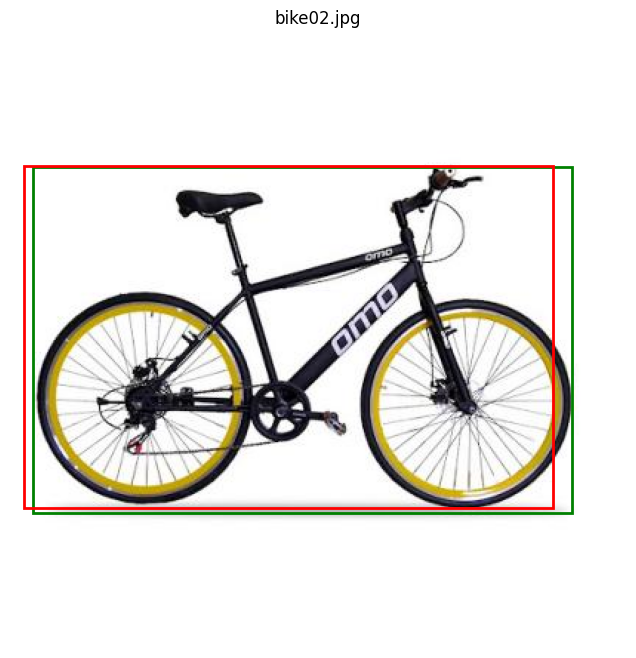

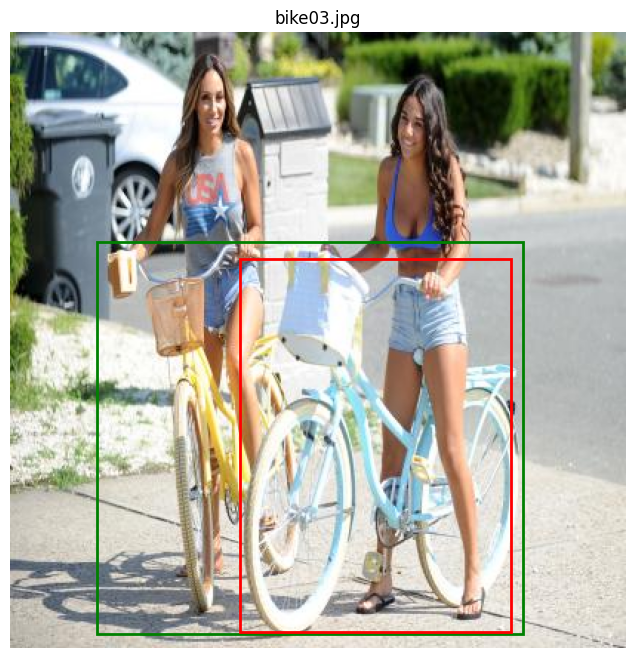

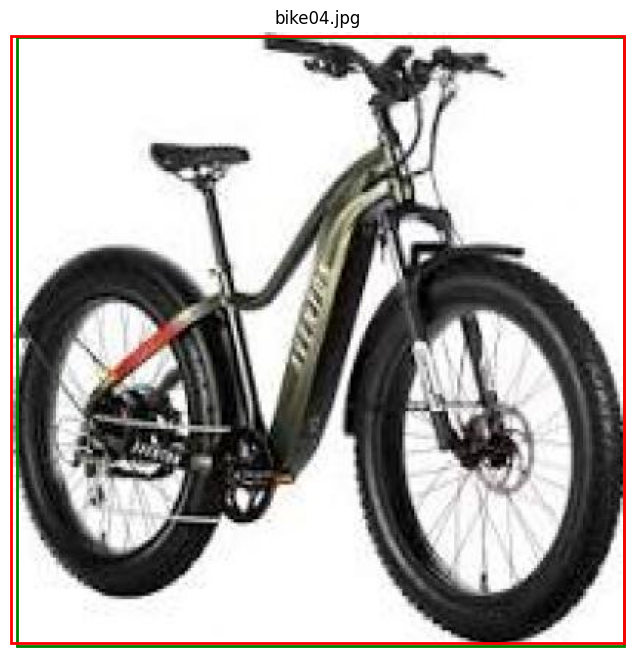

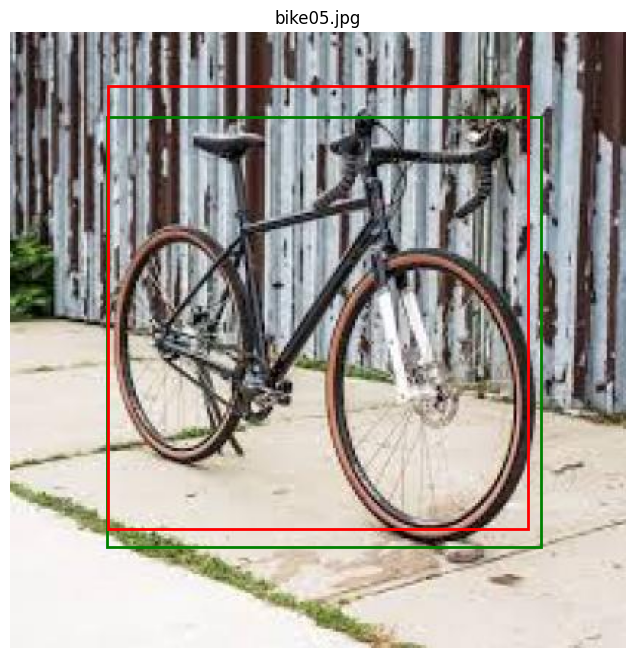

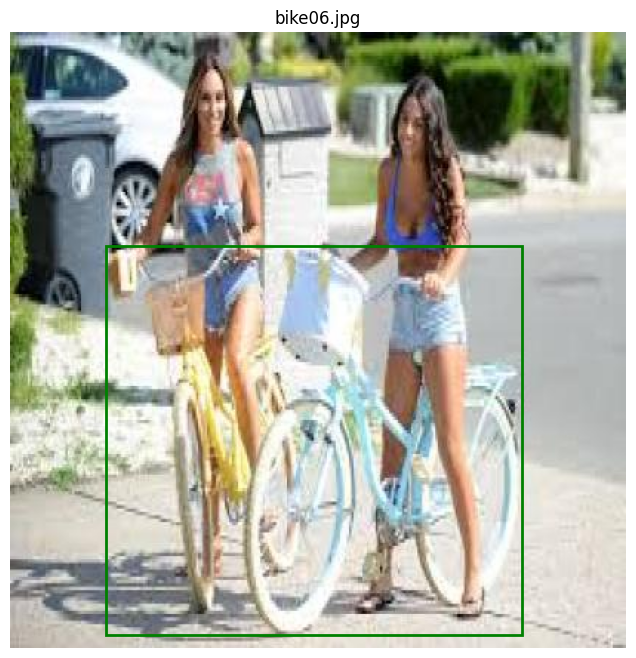

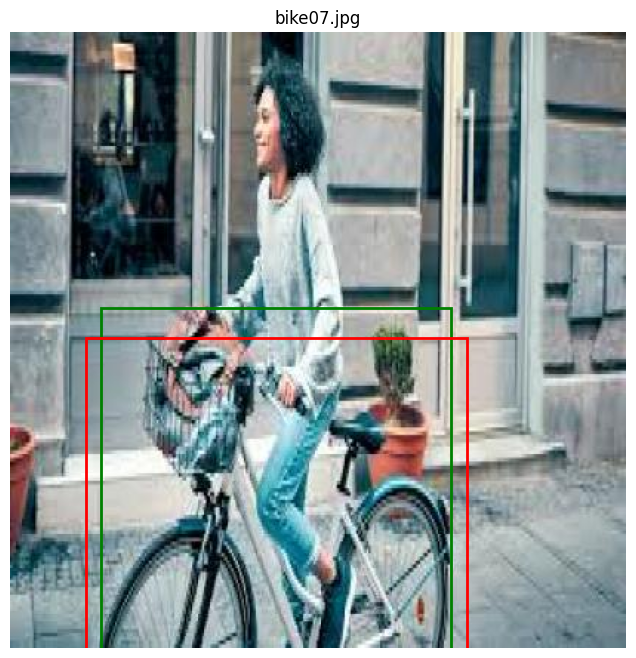

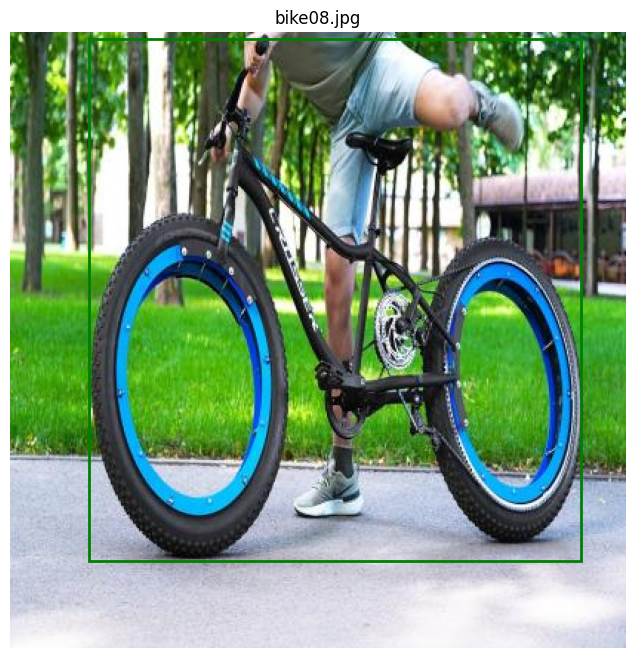

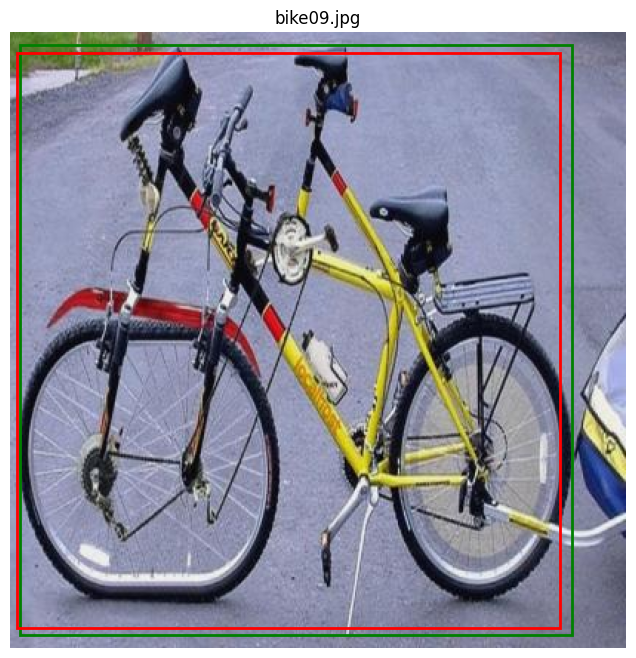

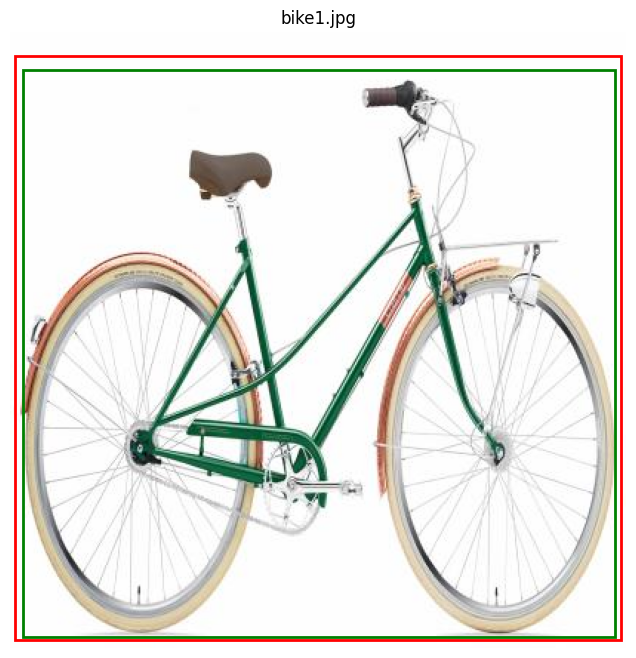

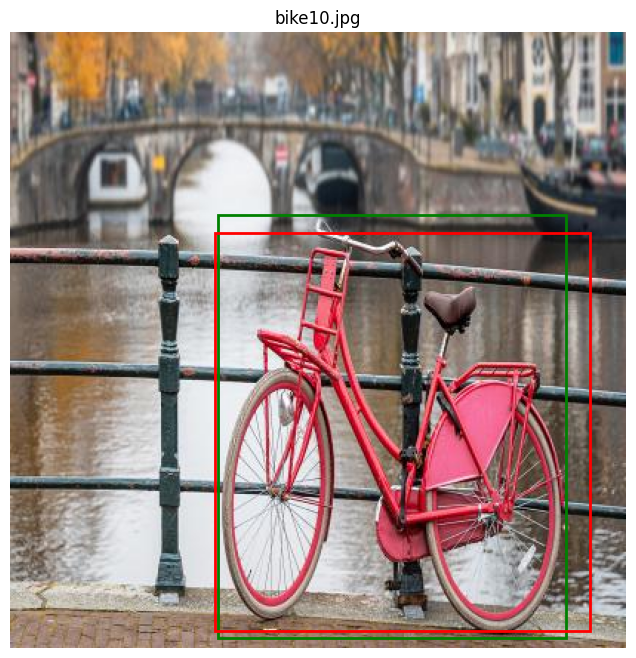

In [6]:
def view_comparision(img_folder, manual_data, ai_client):
    for img_name, box_real in manual_data.items():
        full_path = os.path.join(img_folder, img_name)
        with open(full_path, "rb") as f:
            result = ai_client.analyze(image_data=f.read(), visual_features=[VisualFeatures.OBJECTS])
        
        ai_boxes = []
        if result.objects is not None:
            for obj in result.objects.list:
                if obj.tags and "bicycle" in obj.tags[0].name.lower():
                    b = obj.bounding_box
                    ai_boxes.append([b.x, b.y, b.width, b.height])

        img = Image.open(full_path)
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(img_name)

        manual_rect = patches.Rectangle((box_real[0], box_real[1]), box_real[2], box_real[3], linewidth=2, edgecolor="g", facecolor="none", label="Manual")
        ax.add_patch(manual_rect)

        for i, box_ai in enumerate(ai_boxes):
            ai_rect = patches.Rectangle((box_ai[0], box_ai[1]), box_ai[2], box_ai[3], linewidth=2, edgecolor="r", facecolor="none", label="AI" if i == 0 else "")
            ax.add_patch(ai_rect)
        
        plt.show()

view_comparision("images", data, client)
